<a target="_blank" href="https://colab.research.google.com/github/mmeagher/Understanding-animals/blob/main/jupyter-notebooks/Create%20Synthetic%20Images/stable-diffusion.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

In [ ]:
"""
Author: A.V. Ronquillo
Date: July 21, 2024

## Purpose: This notebook is a proof of concept workflow for generating synthetic images using Stable Diffusion.
## Note: Note: The author generated this text in part with GPT-4,
OpenAI’s large-scale language-generation model. Upon generating
draft code, the author reviewed, edited, and revised the code
to their own liking and takes ultimate responsibility for
the content of this code.

"""

# Introduction

This notebook explains the process of generating synthetic images as a strategy for balancing underrepresented classes in an image dataset. The content showcases a proof of concept of the workflow.


The task of processing these images cannot be adequately performed in the CoLab environment, therefore, these methods of image generation were executed on external platforms.

The production of some of these images was completed using a local GPU by using WSL2 on Linux, as well as a GPU provided by the cloud servers from the Digital Research Alliance of Canada.

# Bias in Model Training & Fine-Tuning

When it comes to the imbalanced dataset, the classification model could impose bias towards the majority class because it encounters more examples of those images during its training.

The model would create more reliable, accurate, and practical predictions if this imbalance was addressed. Additionally, in other real-world applications, correctly identifying the minority class is crucial.

Therefore, generating synthetic images is an important strategy for promoting fariness and balance in the dataset and the context of animal classification. In doing so, there were various methods of executing this strategy through multiple attempts, approaches, and tests.


# Stable Diffusion & its Text-to-Image Function


The main model used in this task is Stable Diffusion and the use of prompts. This model from the Hugging Face Hub is characterized by a text-to-image feature, therefore throughout the scripts in this notebook, this model is facilitated by the implementation of a large list of prompts in order to create a large dataset of animal images.

# **Pasting Synthetic Images onto Real Empty Camera Trap Images**

The first method attempted was to generate synthetic animal images and paste these synthetic animals onto real background images.



## Stable Diffusion Script

This module will include a breakdown of the Python script utilized for this method.

#### Establishing the Virtual Environment for Linux

The script for this method of pasting images was run on WSL2 and a Linux distribution. Within this software domain, there are specific models and wheels to download in the virtual environment.

By using `pip install` in the Linux command line, the `transformers`, `diffusers`, `torch`, and `accelerate`, packages can be installed within the virtual environment shown as `.venv`. The `transformers` and `diffusers` packages are developped by Hugging Face and are used for generative tasks. They provide straightforward pipelines that contain the complexities of running a Stable Diffusion model.

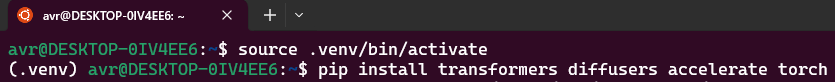

The following Stable Diffusion Script was then written into a Python file and processed on this Linux virtual environment through a bash file.

#### Importing Necessary Libraries

The `StableDiffusionPipeline` is imported from the `diffusers` library package, simplifying the process of generating images from text prompts using the Stable Diffusion model.

PyTorch is also imported through the `torch` library, this is the underlying framework that `diffusers` uses for tensor operations and neural network functions.

The `Image` module from the Python Imaging Library `PIL` is also imported, allowing for opening, manipulating, and saving many different image file formats. Additionally, it also adds the `ImageEnhance`, `ImageFilter`, and `ImageOps` libraries, which will aid in establishing the quality of the generated images.

In [ ]:
from diffusers import StableDiffusionPipeline
from PIL import Image, ImageEnhance, ImageFilter, ImageOps
import torch
import os
import random
import math

#### Defining Directories for the Empty Images and the Output Folder

This module sets up paths to the `input_folder` from the local folder connected to Ubuntu and Linux. This folder has the pre-existing empty images from the data collection. These are camera images in which no animal is present within the frame of the camera view. The generated synthetic animals can then be pasted onto these empty images, balancing the large dataset.

The path to the `output_folder` is also specified, this is where the final generated synthetic images can be found. The `os.makedirs()` arguement creates the directory defined by output folder.

In [ ]:
# Set the input and output folder paths
input_folder = '../data/Emptyimagestest'
output_folder = '../data/Generatedimagestest'
os.makedirs(output_folder, exist_ok=True)

Here is a sample batch of empty camera trap images from the input folder:

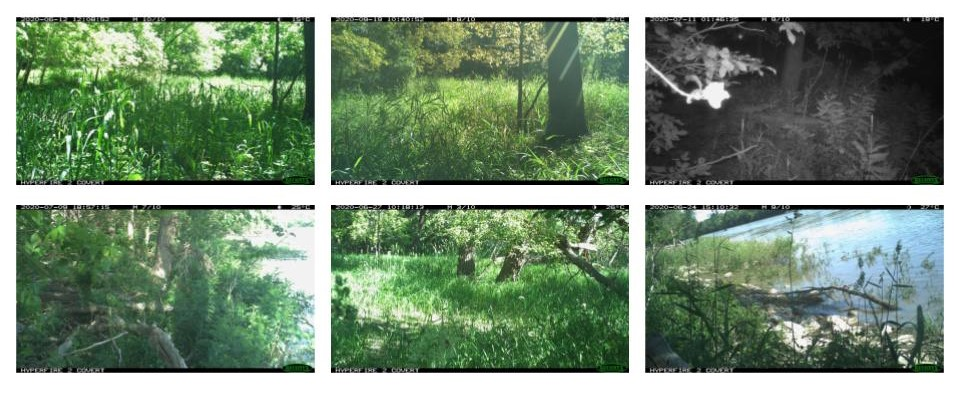

#### Loading & Initializing the Stable Diffusion Model

The `StableDiffusionPipeline` is initialized in this module for the purposes of image generation. It loads a pre-trained Stable Diffusion model while creating a pipeline object. This specifies the model ID stated as `CompVis/stable-diffusion-v1-4`.

The `pipe.to("cuda")` then moves the pipeline computations to a CUDA-compatible GPU, which highly speeds up the image generation process.

In [ ]:
# Initialize StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
pipe.to("cuda")

The model ID was extracted from Hugging Face (https://huggingface.co/CompVis/stable-diffusion-v1-4). Variations of the Stable Diffusion model can be substitued into the script for customizability such as; `runwayml/stable-diffusion-inpainting` (https://huggingface.co/stabilityai/stable-diffusion-2-1#examples) or `stabilityai/stable-diffusion-2-1` (https://huggingface.co/runwayml/stable-diffusion-inpainting/tree/main).

#### Loading a Hugging Face Token for the Stable Diffusion Model

A Hugging Face Token is necessary for loading the Stable Diffusion model. Once this token API is loaded throught this line of code; `os.environ['HUGGINGFACE_CO_API_TOKEN'] = 'paste_your_token_here'`, it will enable the generation of diverse and high-quality images from textual descriptions. One can access personal tokens by navigating the Hugging Face's "API Token" settings https://huggingface.co/docs/hub/security-tokens. These APIs should be kept secured.

In [ ]:
# Use Hugging Face Token
os.environ['HUGGINGFACE_CO_API_TOKEN'] = 'paste_your_token_here'

#### Functions for the Generative Process & Image Quality Parameters

This snippet of code uses functions that opens a `background_img_path`, resizes it and generates a new image from a `prompt` using the Stable Diffusion model from the `pipe` key.

The images are converted to a `RGBA` mode to handle transparency as one of the methods of blending the synthetic animal with the real background image. It then retrieves the background image dimensions, adjusts them to be divisible by 8, and resizes the image using the `LANCZOS` filter, which provides high-quality image reduction.


In [ ]:
def process_and_generate(prompt, background_img_path):
    background = Image.open(background_img_path).convert("RGBA")

    # Resize image to dimensions divisible by 8
    width, height = background.size
    new_width = width - (width % 8)
    new_height = height - (height % 8)
    background = background.resize((new_width, new_height), Image.LANCZOS)

By using `gen_image = pipe(prompt)`, it will enable the script to generate images using the text prompts with the Stable Diffusion Model.

Next, the script provides parameters for quality of the generated images such as adjusting its color saturation and brightness. This provides access to having the ability to troubleshoot the image's visual properties for blending improvements and troubleshooting.


In [ ]:
    # Generate synthetic squirrel image
    gen_image = pipe(prompt).images[0].convert("RGBA")

    # Reduce brightness and vibrant colors of the squirrel
    gen_image = ImageEnhance.Color(gen_image).enhance(0.7)
    gen_image = ImageEnhance.Brightness(gen_image).enhance(0.7)

    # Resize the gen_image to fit within the new background dimensions
    max_gen_width, max_gen_height = math.floor(new_width / 2), math.floor(new_height / 2)
    gen_image.thumbnail((max_gen_width, max_gen_height), Image.LANCZOS)

The `ImageEnhance.Brightness` and transparency of the generated images are important for this method of pasting. This snippet of code aims to establish the synthetic animal itself to be opaque, and for its surrounding synthetic background to be transparent so that it will display a seamless blend of the animal on top of the empty camera image.

Within the context of each prompt being processed, the script will also randomly position the generated image on the background as an inherent part of the pasting method. This is executed by setting the `x` and `y` positionings of the synthetic image.

In [ ]:
    # Create a transparent background for the image
    alpha = gen_image.getchannel("A")
    alpha = ImageEnhance.Brightness(alpha).enhance(0.9)  # Make it transparent
    gen_image.putalpha(alpha)

    # Randomly position the generated squirrel on the background
    x = random.randint(0, new_width - gen_image.width)
    y = random.randint(0, new_height - gen_image.height)

    # Ensure seamless blending - paste the fox image with respect to its alpha channel
    background.paste(gen_image, (x, y), gen_image)
    result_image = apply_camera_trap_effects(background, background)

    return result_image

#### Applying Camera Trap Effects

The goal of the appearance of the images is to reach a closeness and relevancy to the original dataset. The generated outputs are set with camera trap filters in order to closely mimic the aesthetics of the empty camera images. This is executed by applying certain principles for the image filters such as grayscale images and motion blur.

The snippet of code uses `if` statements to iterate through the images and checks if they are in night time settings (`background.mode == "L"`). If that is the case it ensures that the synthetic animals are also generated and pasted in grayscale in order to match the background.

The motion blur is applied to the synthetic animal by using a `GaussianBlur` filter. The general blur aids in blending the synthetic animal and improving its correlation to the camera trap aesthetic. This blur `radius` is then set to a specified value and can be adjusted throughout the process of troubleshooting the image quality.

In [ ]:
def apply_camera_trap_effects(result_image, background):
    """Apply effects to mimic camera trap image aesthetics."""
    # Convert to grayscale if the background is grayscale
    if background.mode == "L":
        result_image = result_image.convert("L")

    # Check if the background image is dark to simulate nighttime effect
    bg_gray = background.convert('L')
    if bg_gray.getextrema()[1] < 80:  # If the background is very dark
        result_image = ImageEnhance.Brightness(result_image).enhance(0.7)
        result_image = result_image.convert("L").convert("RGBA")

    # Enhance contrast
    enhancer = ImageEnhance.Contrast(result_image)
    result_image = enhancer.enhance(1.5)

    # Apply blur to simulate motion blur
    result_image = result_image.filter(ImageFilter.GaussianBlur(radius=0.7))

    return result_image

#### Image Save Path

The output images are converted to `RGB` mode if the image is in a `.jpeg` format. This snippet of code then combines the `output_folder` with the `filename` to create a full `image.save(path)` that will save the processed image to the specified directory.

In [ ]:
def save_image(image, filename):
    if filename.lower().endswith(".jpg") or filename.lower().endswith(".jpeg"):
        # Convert image to 'RGB' mode before saving to JPEG format
        image = image.convert("RGB")
    path = os.path.join(output_folder, filename)
    image.save(path)

#### Large List of Prompts

This module consists of a comprehensive list of text prompts to direct the generation of the synthetic images. These prompts specify details like the position, size, and activity of a fox in the image.

In [ ]:
# Define prompts
prompts = [
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking away perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing perspectivally in the foreground as a bigger fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is sitting on the left side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing in the center of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is looking around perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is up close on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking perspectivally in the midground as a medium-size fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is walking on the right side of the overall frame of the empty image. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is foraging perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is jogging perspectivally in the background as a smaller fox. Do NOT generate multiple foxes.",
    "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is running perspectivally in the background as a smaller fox. Do NOT generate multiple foxes."
]

#### Iterate Through the Prompts & Process the Images

The last part of the script uses a `for` loop statement to finalize the image generation. This module takes `all_filenames` from the input folder and lists all the jpeg images in the directory.

Each prompt will be iterated through and the `enumerate` function integrates the index `i` and the `prompt`. Overall, for each empty image and `filename` from the input folder, the script will randomly assign one of these prompts to the empty image.

Additionally, the modulu operator `%` is utilized to cycle through all the `filenames`. If there are more images than prompts, then the prompts are reused in a cycle.


In [ ]:
# Get all .jpg filenames from the input folder
all_filenames = [filename for filename in os.listdir(input_folder) if filename.lower().endswith('.jpg')]

# Generate and save images
for i, prompt in enumerate(prompts):
    # Use the same image filename for all prompts or cycle through available filenames if not enough images
    filename = all_filenames[i % len(all_filenames)]

By using the `result_image` function, it calls the `process_and_generate` argument with the selected prompt and empty image in order to create a new synthetic image with the Stable Diffusion model. This function initiates and deals with all the image processing steps that were previously discussed.

Each generated image is constructed using the `"generated_"` prefix to distinguish the results. The generated synthetic images are then saved to the output folder by recalling the `save_image` function.


In [ ]:
    background_img_path = os.path.join(input_folder, filename)
    result_image = process_and_generate(prompt, background_img_path)
    save_image(result_image, f"generated_{i+1}_{filename}")

print("All images processed and saved.")

The script running in Linux:

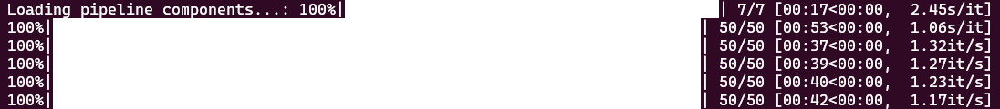

### Paste Method Results based on Testing Different Types of Prompts & Image Quality Parameters

Throughout the troubleshooting process, there were various iterations of types of sentences and base prompts used for Stable Diffusion's image generation. This module will explain the different results by displaying sample images and sample sentences used from the base prompts.


###### **Base Prompt 1:**

In [ ]:
prompts = [ "A realistic fox sitting in the right side of the image.",
          "A realistic fox running in the center of the image." ]

In the first tests of the script, the model uses the prompts to generate full images with semi-transparent backgrounds and overlaying these results on top of the empty images from the input folder.

This first base prompt is doing a general description, it did not have much direction to it. Therefore, there are multiple foxes being displayed. Furthermore, the simple sentence has visualized foxes in different mediums such as animated illustration of the fox in addition to textured fur. These results were being displayed despite the word `"realistic"` being included in the base prompt, showing early signs that the model struggles with adhering to prompt instructions in a consistent manner.

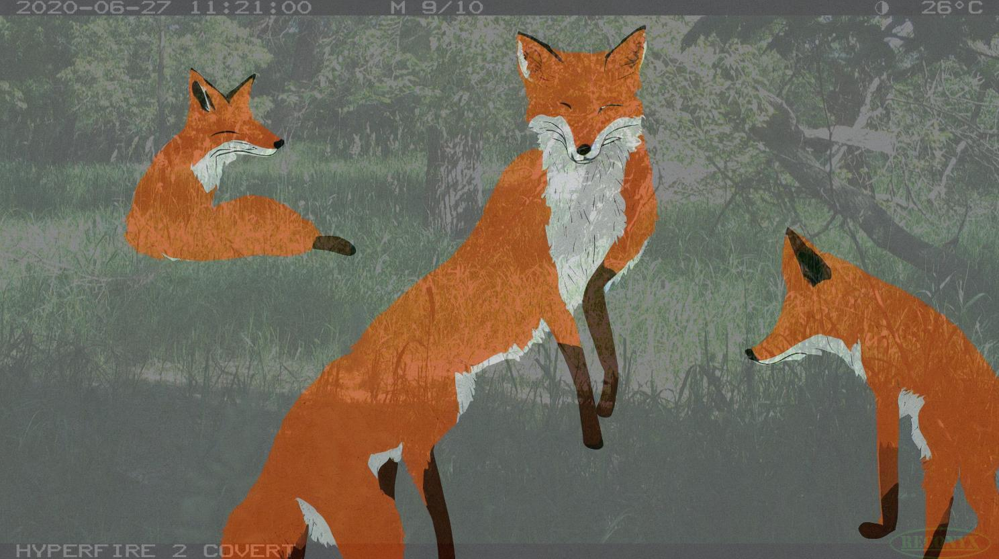

In these sample images from the output folder, the foxes are depicted with multiple legs, stretched torsos, and a missing head. Overall, these images do not properly relate to the location features of the empty camera images, showing struggles with scale, blending, and animal anatomy.

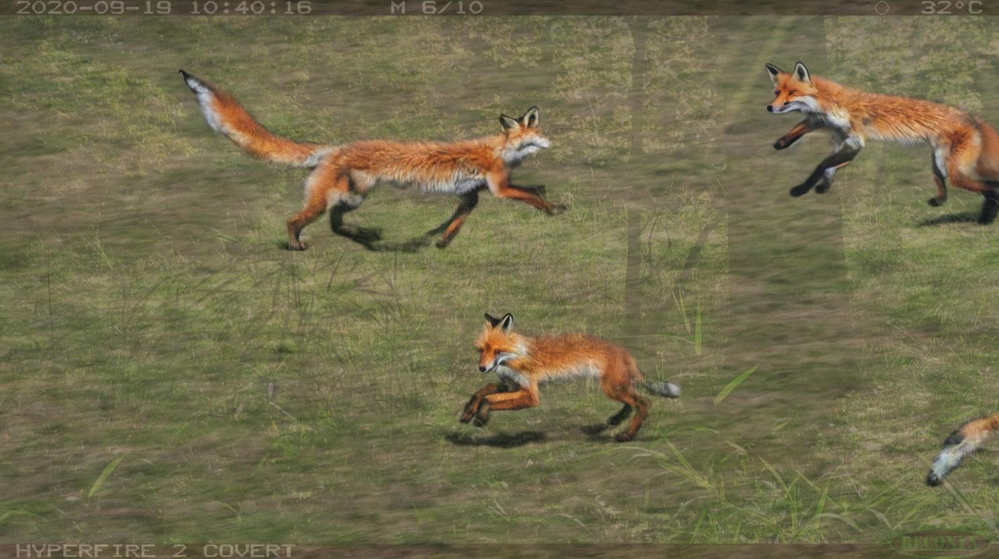

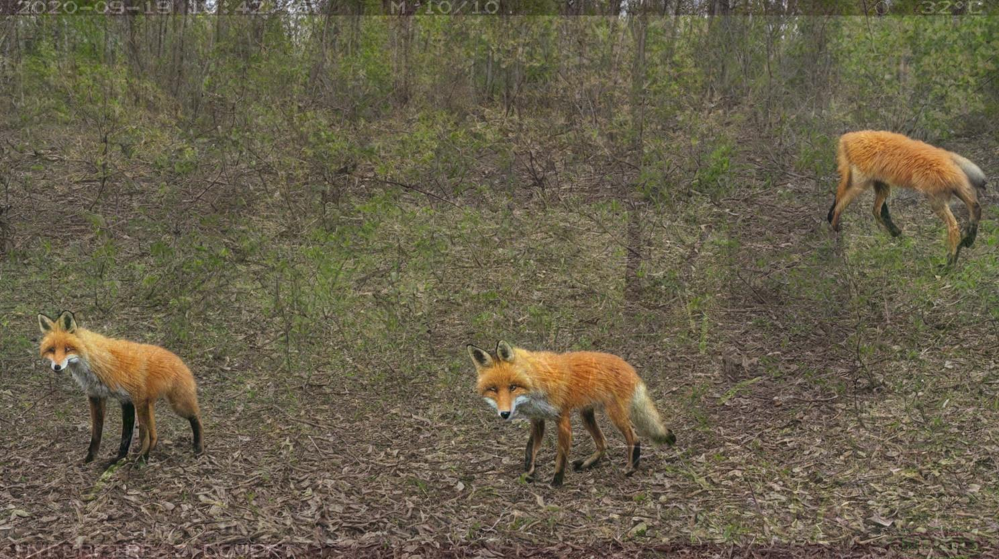

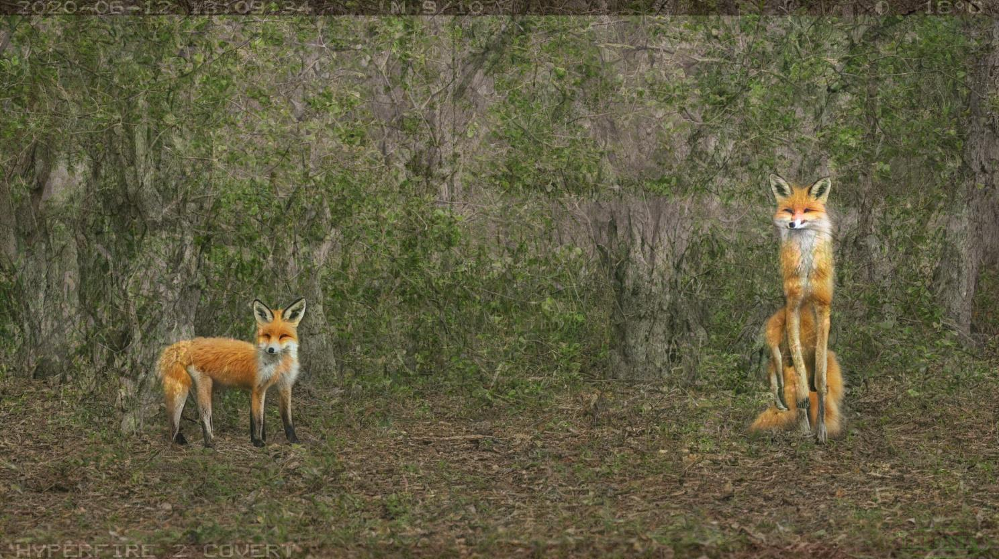

###### **Base Prompt 2:**

In [ ]:
prompts = [ "A singular anatomically correct fox running in the center of the image." ]

Based on the previous results, this new base prompt was tested with the added instruction of the animal being `"singular"` and `"anatomically correct"`.

The results show a slight improvement in anatomy throughout the majority of images from the output folder dataset. However, there is still issues with blending and ensuring that the synthetic images relate to the empty image when it comes to perspectival scale. The results continue to show a semi-transparent background instead of the model generating only the animal itself without a full background photograph.

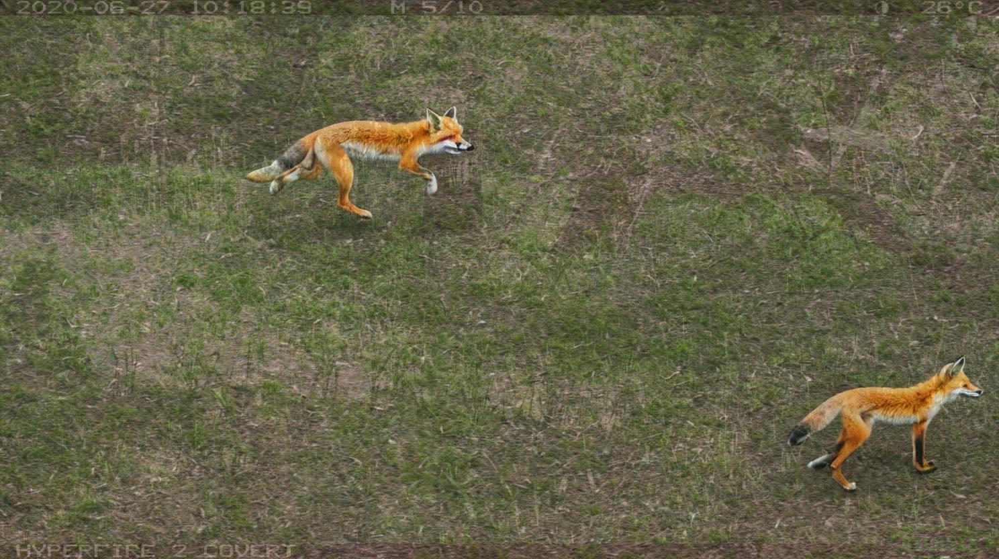

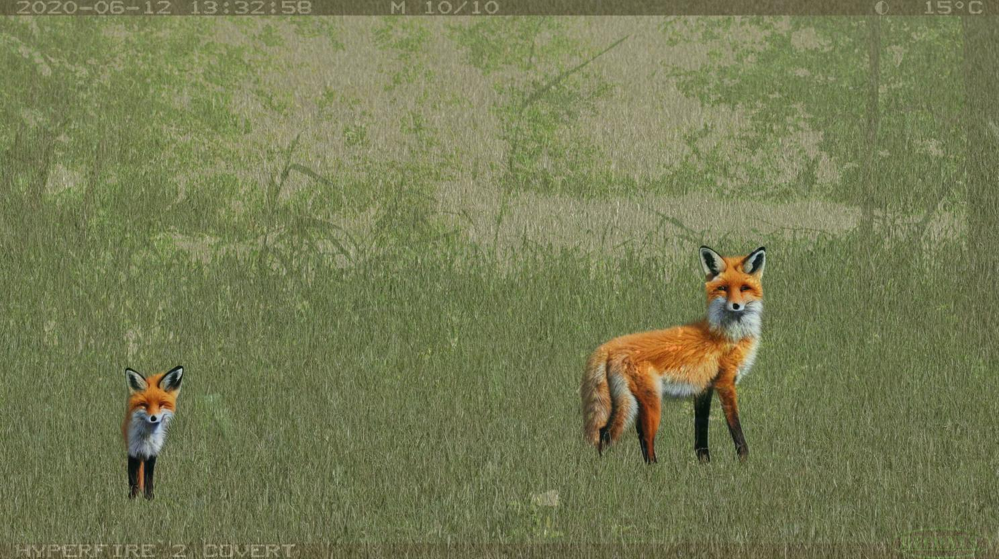

This sample image below showcases that the model is able to generate the synthetic animal as grayscale because it recognizes that the empty image is set in night time.

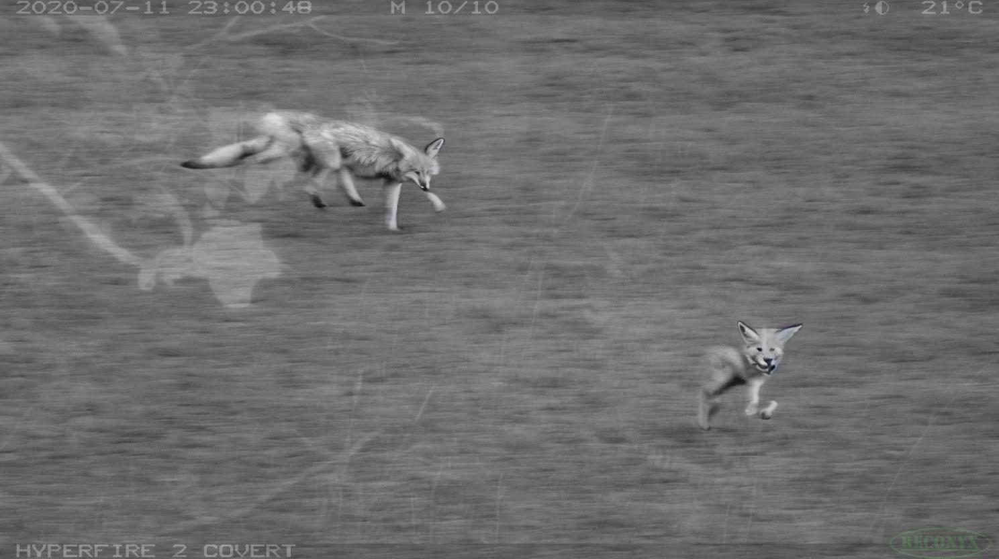

###### **Base Prompt 3:**

In [ ]:
prompts = [ "A realistic photograph of an anatomically correct fox by itself with no background image. This one singular fox is up close in the center of the overall frame of the empty image.",
           "A realistic photograph of an anatomically correct fox by itself with no background image. This one singular fox is looking around perspectivally in the midground." ]

In this test, the prompt was updated to instruct the model to generate the animal as a `"realistic photograph"` that is `"by itself with no background image"`. The attempt is to test if the Stable Diffusion model can generate the animal as a cutout with a transparent background based on prompt language.

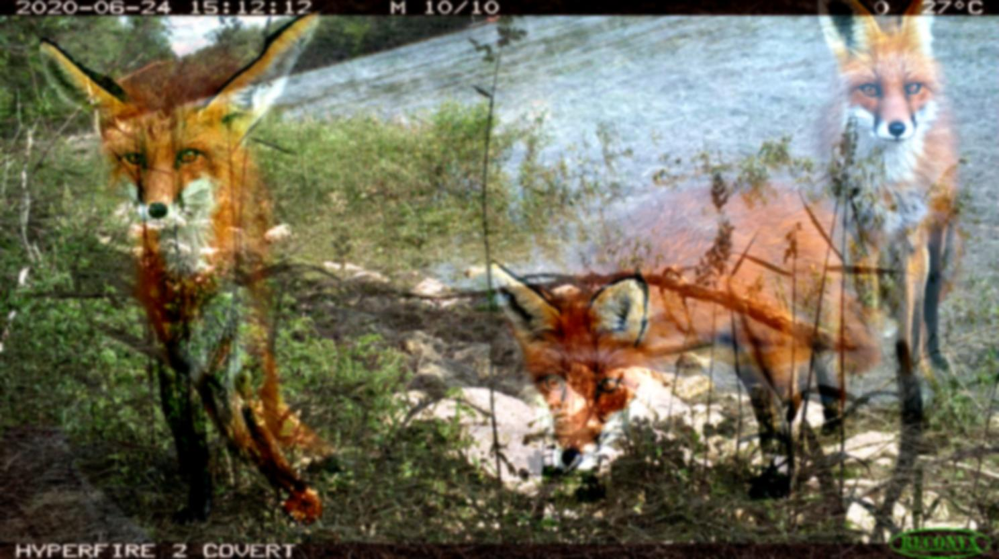

Despite continuing to use the word `"singular"`, the model is still generating multiple animals per empty image.

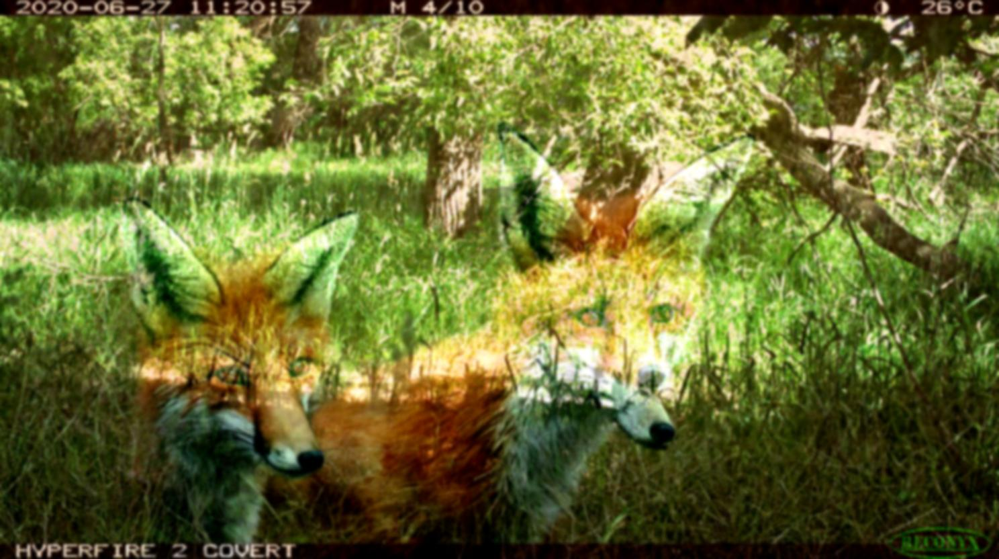

One approach in this test is to use different values for the `alpha` setting and to add the `GuassianBlur`. By increasing the blur `radius` to 0.7, the synthetic animal is generated with the filter. In doing so, it tests the model to generate images that mimic the camera trap aesthetic and compression of the original empty images. However, these images are still quite far off when it comes to its relevancy to the original dataset.

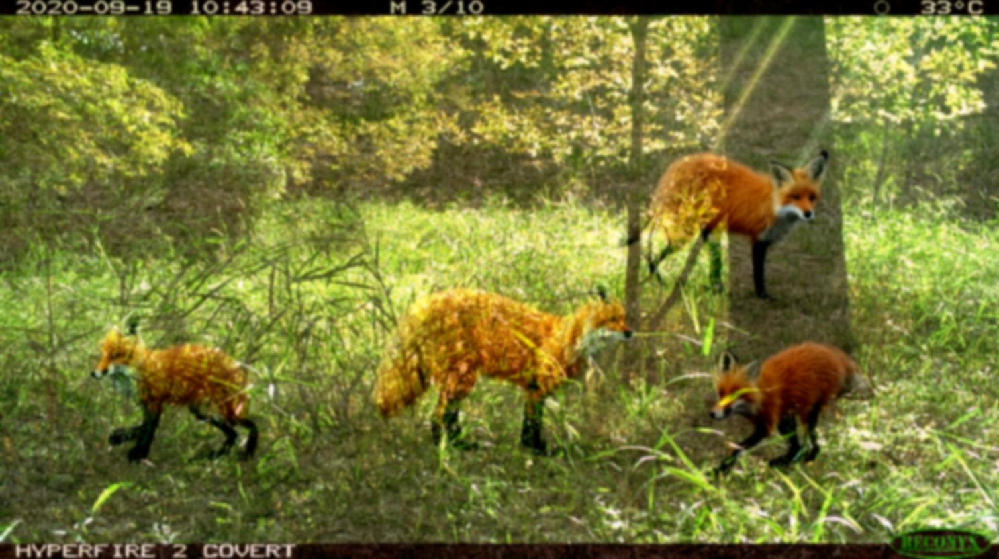

###### **Base Prompt 4:**

In [ ]:
prompts = [ "A realistic photograph of one singular fox by itself with no background image. This cutout of the fox is standing perspectivally in the foreground as an adult fox. Do NOT generate multiple foxes." ]

prompts = [ "A realistic photograph of one singular squirrel by itself with no background image. This cutout of the squirrel is standing perspectivally in the foreground as an adult squirrel. Do NOT generate multiple squirrels." ]

Due to the previous results, this final base prompt attempts to address the issue of generating multiple animals instead of consistently creating one singular animal. In doing so, the prompts were updated with the added instruction of a negative prompt: `"Do NOT generate multiple foxes"` or `"Do NOT generate multiple squirrels"`.

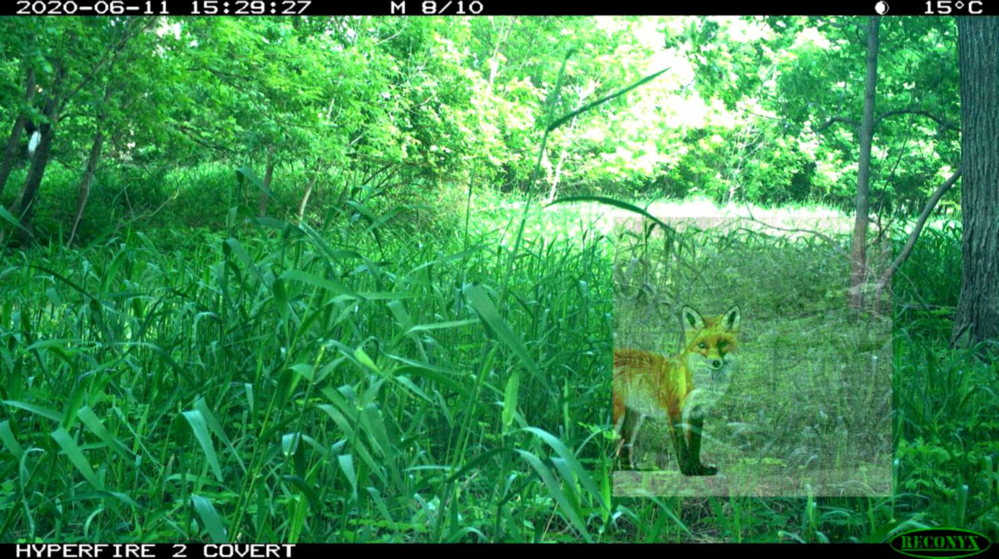

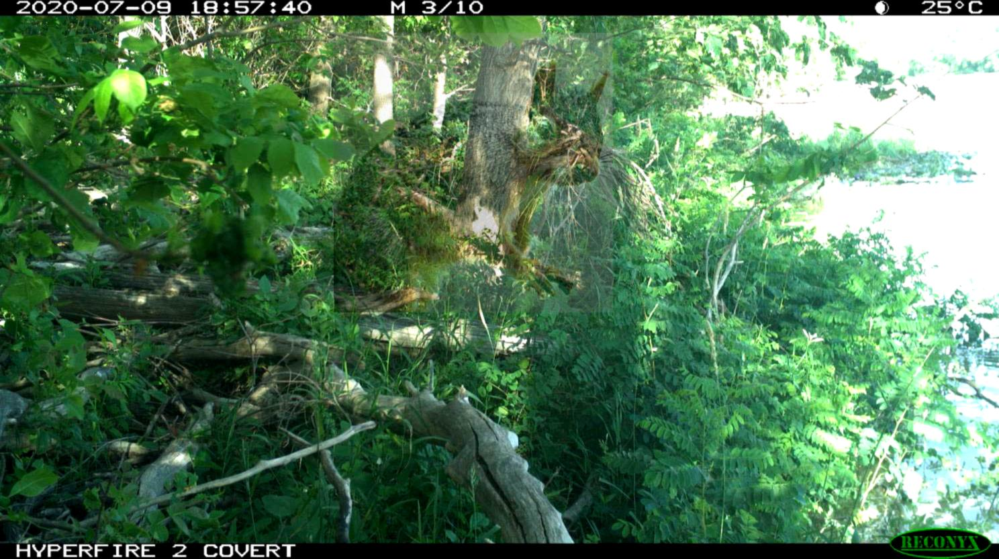

Throughout the dataset of images created in this attempt, the model was very succesful in generating only one animal per empty image in a consistent manner. Every single empty image was paired with one fox or squirrel.

However, the animal is also being displayed with a bounding box. In an attempt to counter this issue, the `ImageEnhance.Brightness` aspect of the script was adjusted to increase the opacity to 100%. The `alpha` setting was then set to make the synthetic image be fully transparent, hoping that the animal itself will be opaque while the bounding box is transparent. The resulted image below was unsuccesful.

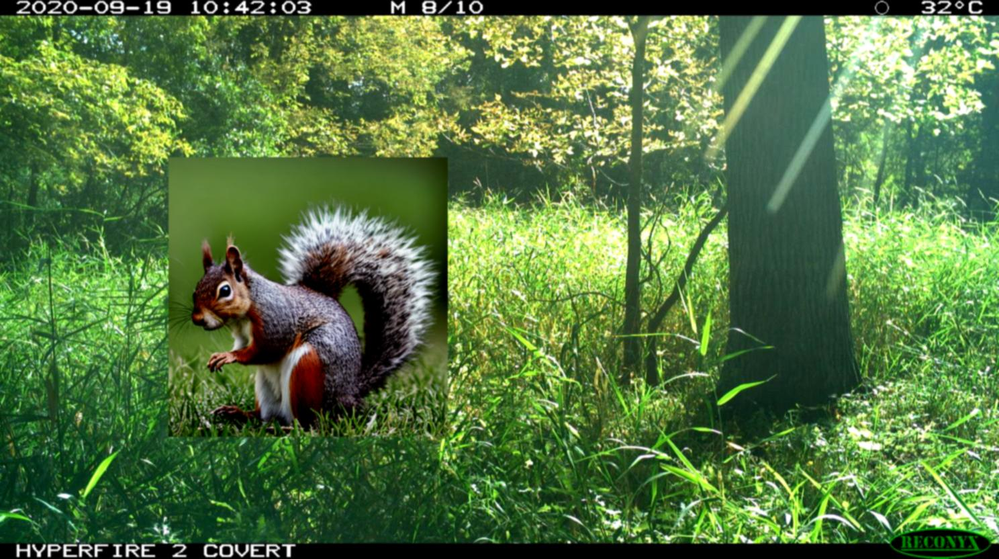

By focusing on prompt specificity and the word `cutout`, there is improvement in the way that the animal is rendered with the features of the empty image. However, there is still an issue with appearance of scale and the bounding boxes.

Using transparency as an approach to blending was an attempt to create superimposition with the foliage and the animal. But the Stable Diffusion model struggles to separate the opacity of the bounding box and the animal. Therefore, this base prompt produces images that are still quite far when it comes to its closeness and relevancy to the overall project.

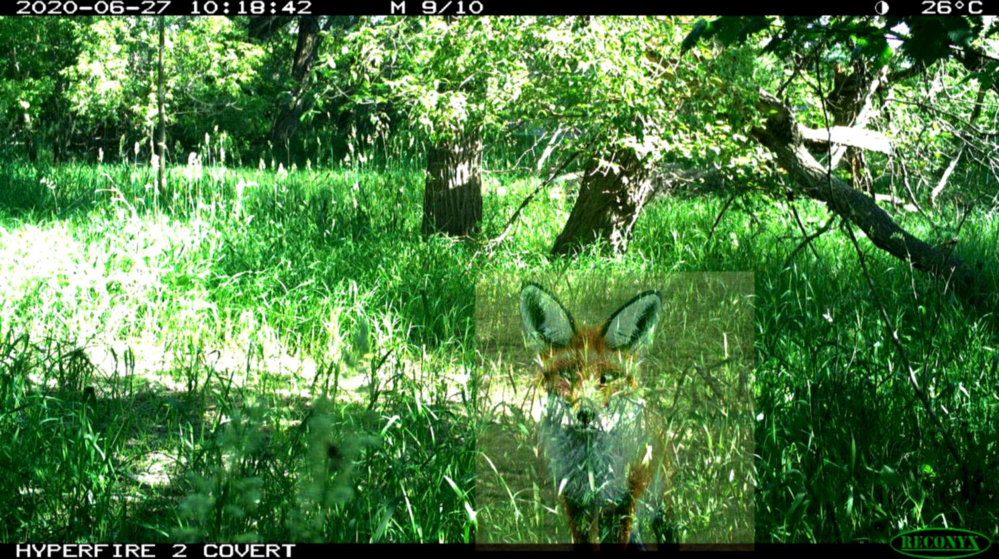

#### Other Attempted Methods using Stable Diffusion

Multiple approaches using Stable Diffusion was attempted throughout the process. The result of these images were failed attempts and included for documentation of such an iterative method.

##### **Generating Images From Scratch without Empty Images:**

In [ ]:
prompts = [ "A singular anatomically correct fox walking to the left side of the image, in a photorealistic setting in a Bur Oak Forest in Manitoba with a sense of scale in relation to the background." ]

The Stable Diffusion Model was also used to try generating images fully from scratch. This type of image generation was attempted in order to test the realism of the model. The purpose was to test its capabilities to adhering to prompt instructions whilst generating images with a proper sense of scale. Because this approach does not include any pre-existing empty camera trap images, a location is specified in the prompt.

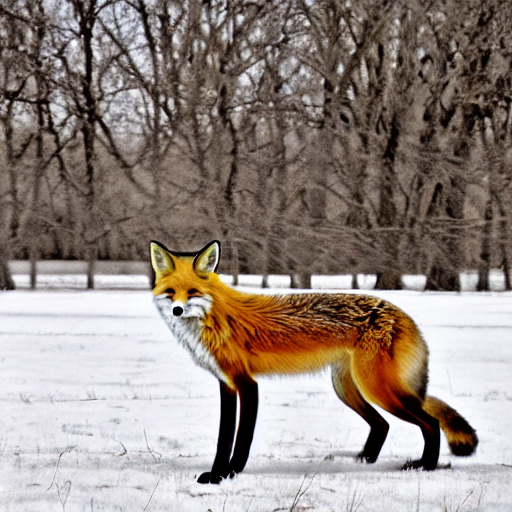

The model was tested to generate the photorealistic fox along with an accurate display of the location stated in the prompt. The Bur Oak forest is native to Manitoba and the image generation aimed to produce the animal with a good visual correlation to the place. However, these images are still not as veristic and rigorous when it comes to its closeness to the original dataset.

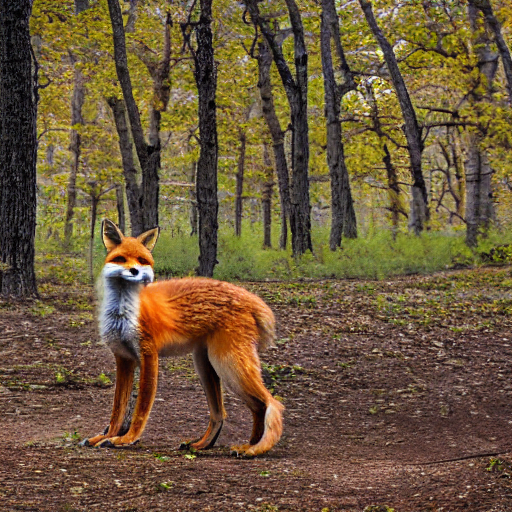

##### **Overlaying Masks using the Stable Diffusion InPaint Model:**

In [ ]:
prompts = [ "A high contrast, black and white silhouette of a white-tailed deer lingering perspectivally in the foreground."
          "A high contrast, black and white silhouette of a fox walking from the right side of the image in the foreground." ]

This method required additional steps and a new block of prompts. The Stable Diffusion script was copied and modified to test this approach.

The script uses the Stable Diffusion InPaint model. It is integrated with 2 sets of prompts, 1 set will generate high-contrast masks based on the empty images from the input folder. The other set of prompts will generate a realistic photograph of the animal within the masks outlines. The motive behind this method is to eliminate the solid bounding boxes that continued to appear in the images from 'Base Prompt 4' in the previous Stable Diffusion script.

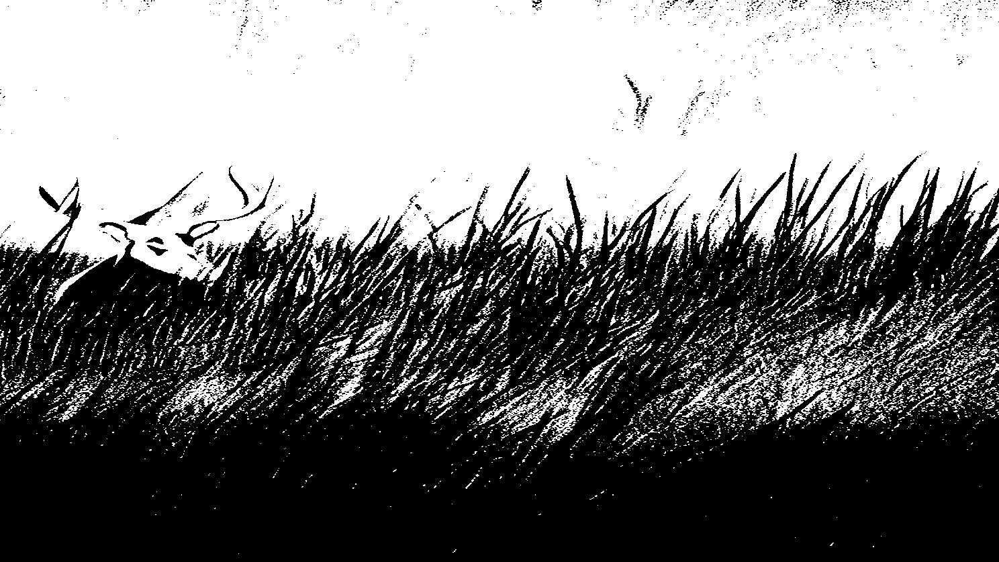

By using the masks to assist in generating the animals, there is superimposition with the grass and other foliage objects in the image. This process was executed as a response to increase the realism of the output images. In doing so, a method of blending the synthetic images can be tested without the use of transparency.

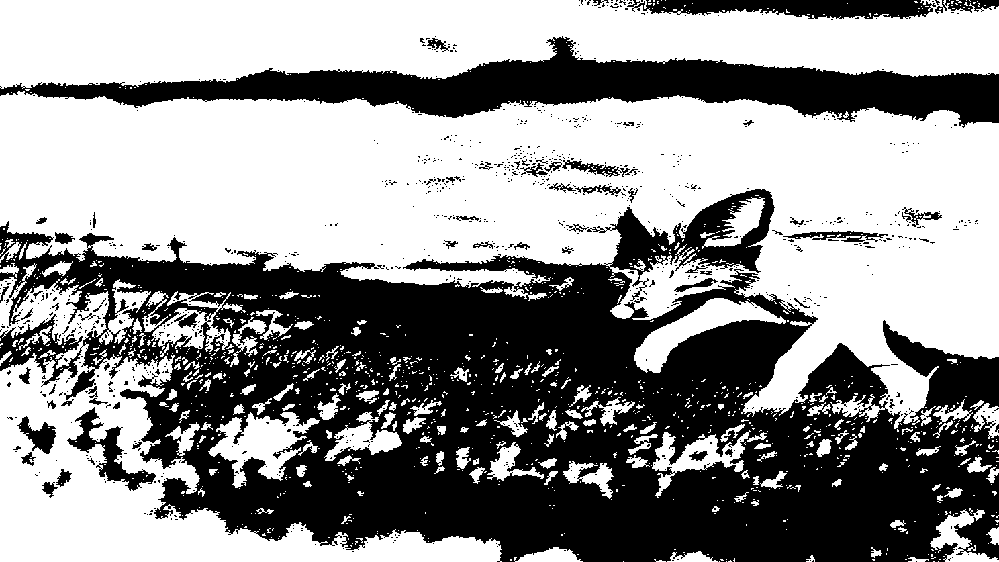

Unfortunately, there were errors with the script running in Linux. Specifically, the second set of prompts that renders the image using the masks were not being properly processed using the Stable Diffusion InPaint model. Therefore, this approach of overlaying masks resulted as a failed attempt in the process.

### Ethical Considerations

There are ethical considerations that come with generating synthetic images for this project. It should be properly disclosed throughout the project that these are synthetic animals. This promotes ethical transparency and educational integrity. In doing so, it will aid in the understanding of the overall methodology, troubleshooting process, as well as the different benefits and limitations of this study. The potential uses of these synthesized images outside of the research context should also be anticipated in order to avoid any possible negative impacts.

This specific method of pasting deals with a synthetic animal on a real background. To an extent, there are facets of misinterpretation that may arise due to the alteration of a photograph based on an environment. There should be a clear documentation and ethical use of the real backgrounds as it might impact understanding of wildlife.

Fairness, bias, and reliability of the classification model is also an ethical factor. Synthetic animals in unrealistic behaviours could also impact perception. If the synthetic animals are not diverse enough in poses, actions, movement, appearance, or continue to be inaccurately portrayed compared to real animals, it could inflict potential issues with the model's classification performance. Additionally, the depiction of the animal should not foster any harmful behaviour as this could potentially impact the project's context of animals in a natural habitat.

### Impacts of this Nature of Research

This methodology of generating synthetic animals on real background images has certain impacts that should be noted. Although the prompts were very specific, there were difficulties with ensuring that the model adhered to these prompts through the conditions of the script. This created some images that were not accurate depictions of the animal. The seamless integration of the animal onto the real background was not succesful. Therefore, the method of creating these inaccurate synthetic images led to various studies testing different methods in order to attempt to produce better results. In doing so, it broadened the depth of the research as it provided a deeper understanding of the Stable Diffusion model and the code parameters of the script.
